<a href="https://colab.research.google.com/github/Tiger-A/GoogleCollab/blob/main/pre_annotate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
HOME = '/content'
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 415, done.
remote: Counting objects: 100% (178/178), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 415 (delta 137), reused 125 (delta 122), pack-reused 237
Receiving objects: 100% (415/415), 12.85 MiB | 15.44 MiB/s, done.
Resolving deltas: 100% (214/214), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 12.1 MB/s eta 0:00:00


In [ ]:
CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinB_cfg.py")
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha2/groundingdino_swinb_cogcoor.pth
WEIGHTS_NAME = "groundingdino_swinb_cogcoor.pth"
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)

/content
/content/weights


In [ ]:
%cd {HOME}/GroundingDINO
from groundingdino.util.inference import load_model, load_image, predict, annotate

model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/content/GroundingDINO


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [ ]:
%cd {HOME}
work_dir = '/content/work_dir'
images_dir = os.path.join(work_dir, 'images')
labels_dir = os.path.join(work_dir, 'labels')

/content


In [ ]:
# для демо. создание каталогов
os.makedirs(images_dir)
os.makedirs(labels_dir)
# и перед запуском следующей ячейки нужно закинуть картинки в images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

# Путь к вашей папке в Colab
source_dir = '/content/drive/MyDrive/Colab Notebooks/UII/internship_safe _head/img_v5'

# Путь к папке в Google Drive
destination_dir = '/content/work_dir/images'



# Копирование папки из Colab в Google Drive
shutil.copytree(source_dir, destination_dir)

'/content/work_dir/images'

In [ ]:
img_path_list = [os.path.join(images_dir, img_name) for img_name in sorted(os.listdir(images_dir))]

In [ ]:
classes = ['helmet', 'head', 'hair', 'person']
classes_dict = {k:v for v, k in enumerate(classes)}
print(classes_dict)

{'helmet': 0, 'head': 1, 'hair': 2, 'person': 3}


In [ ]:
pip install supervision

In [ ]:
import supervision as sv
import torch

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr

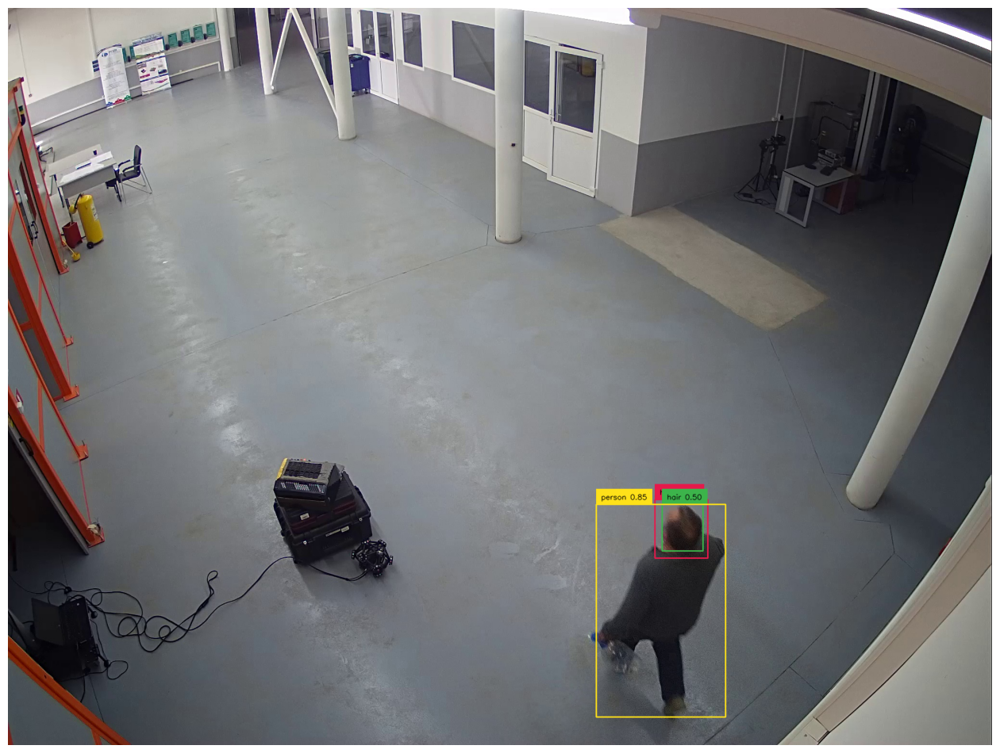

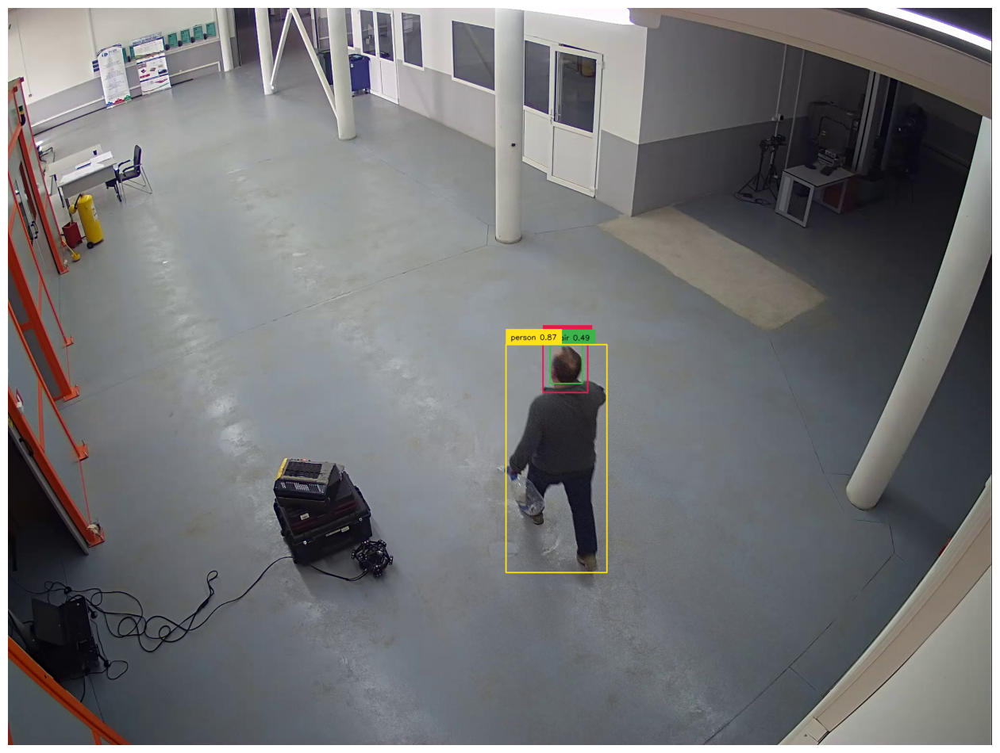

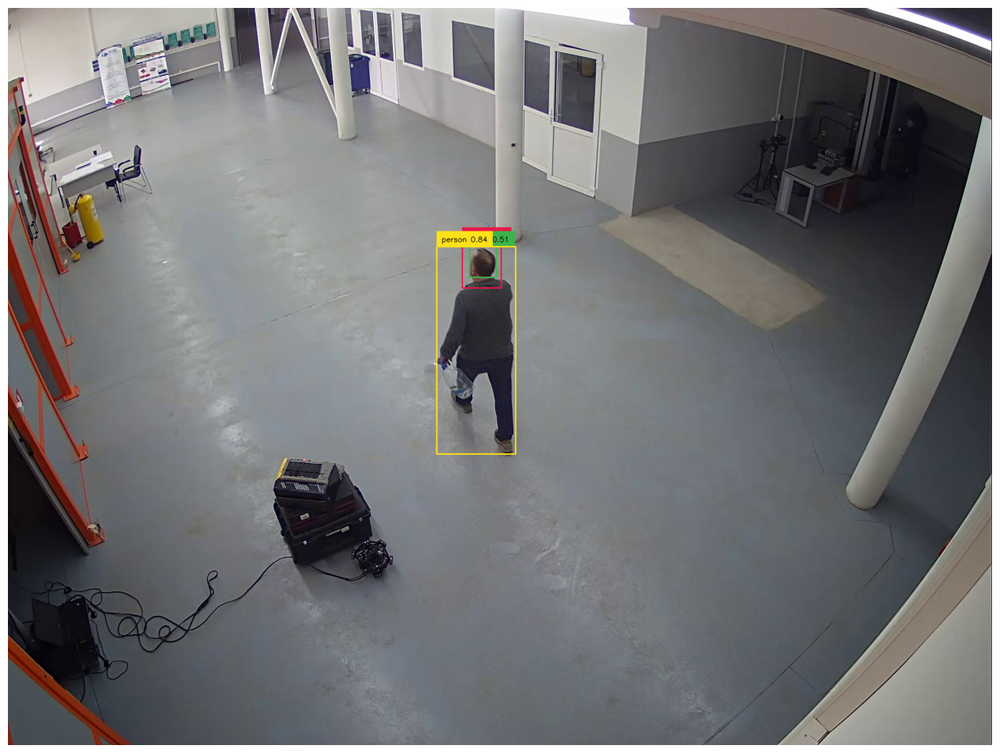

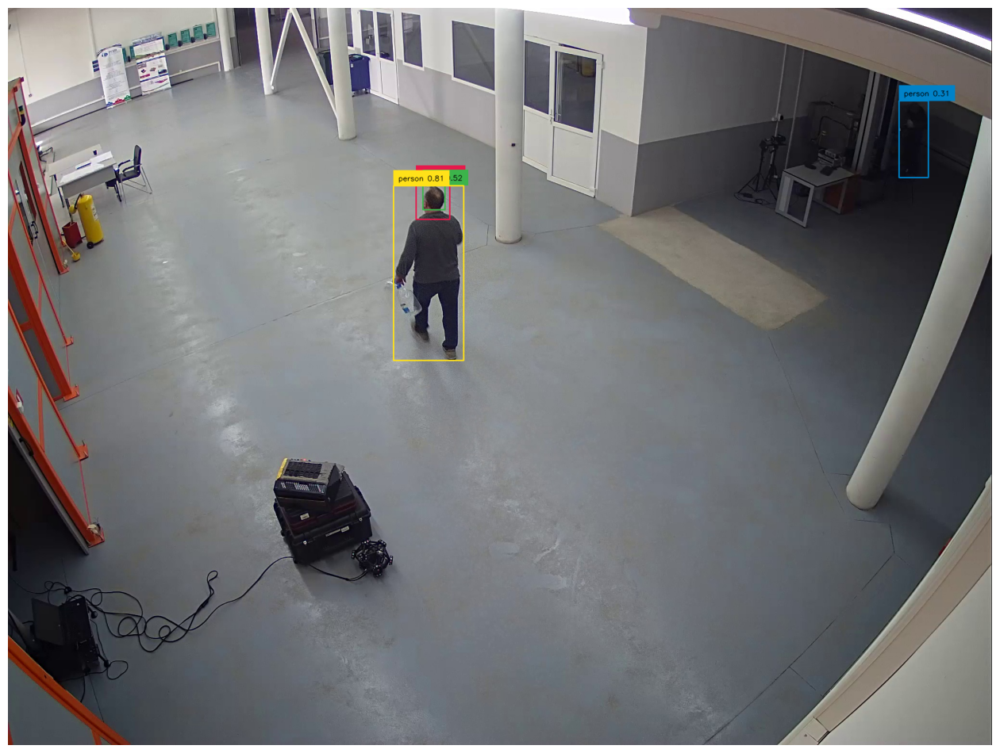

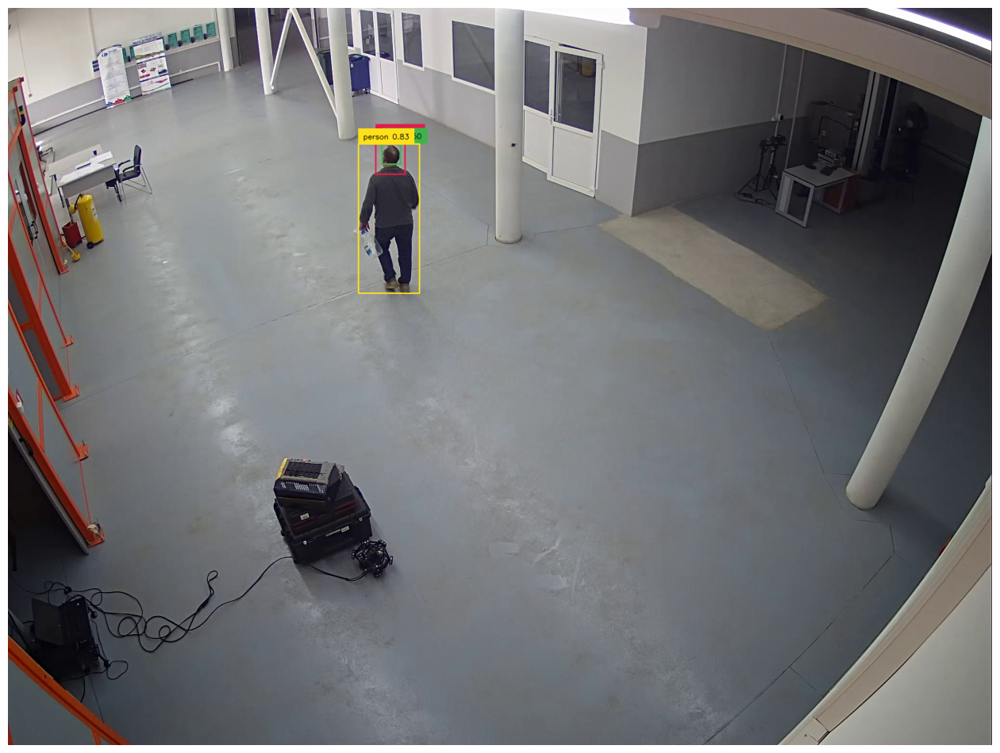

...

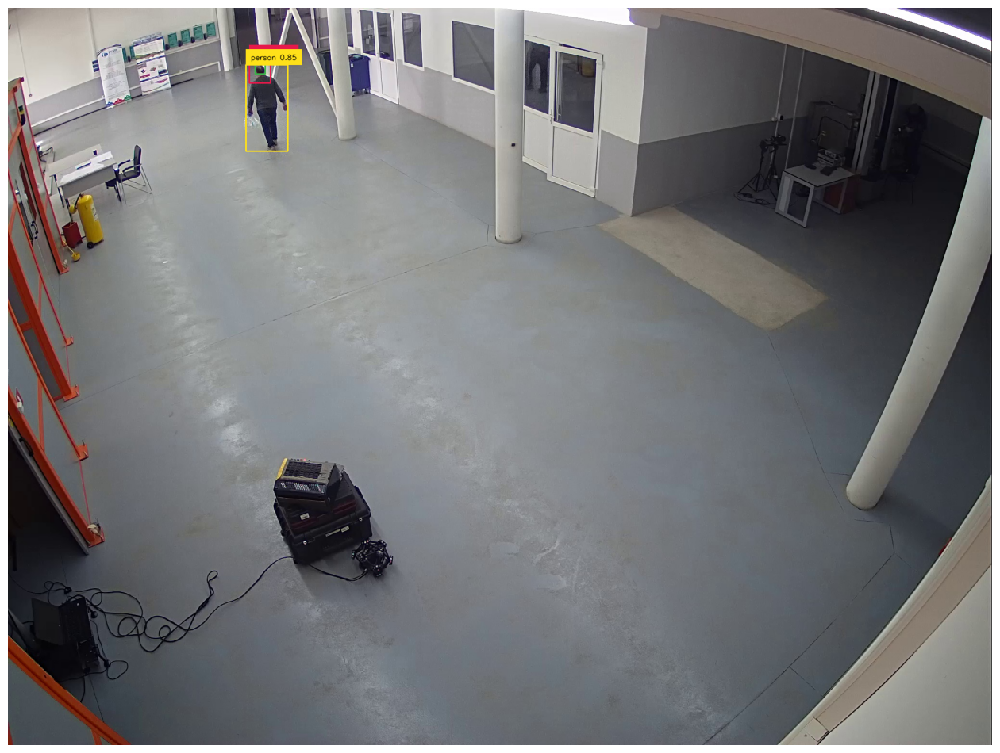

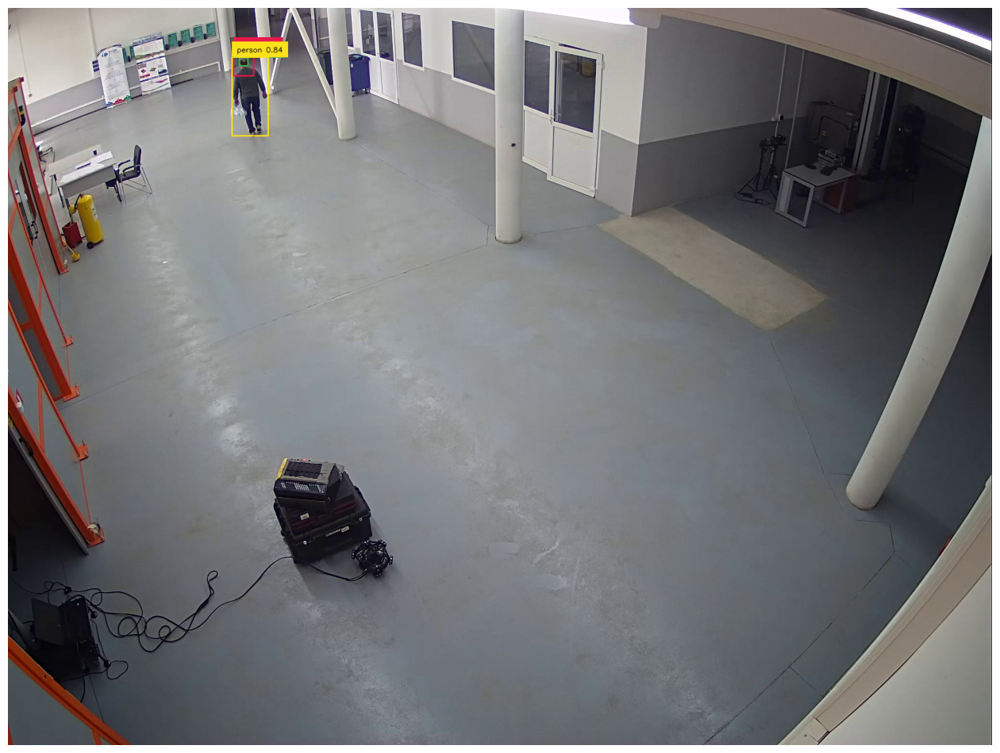

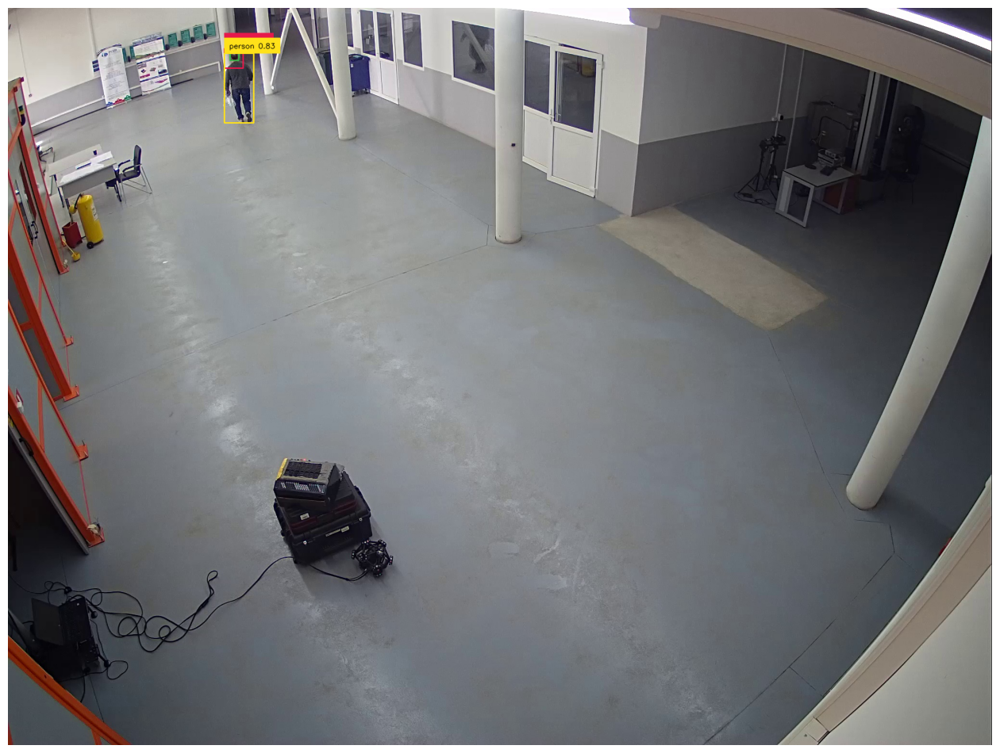

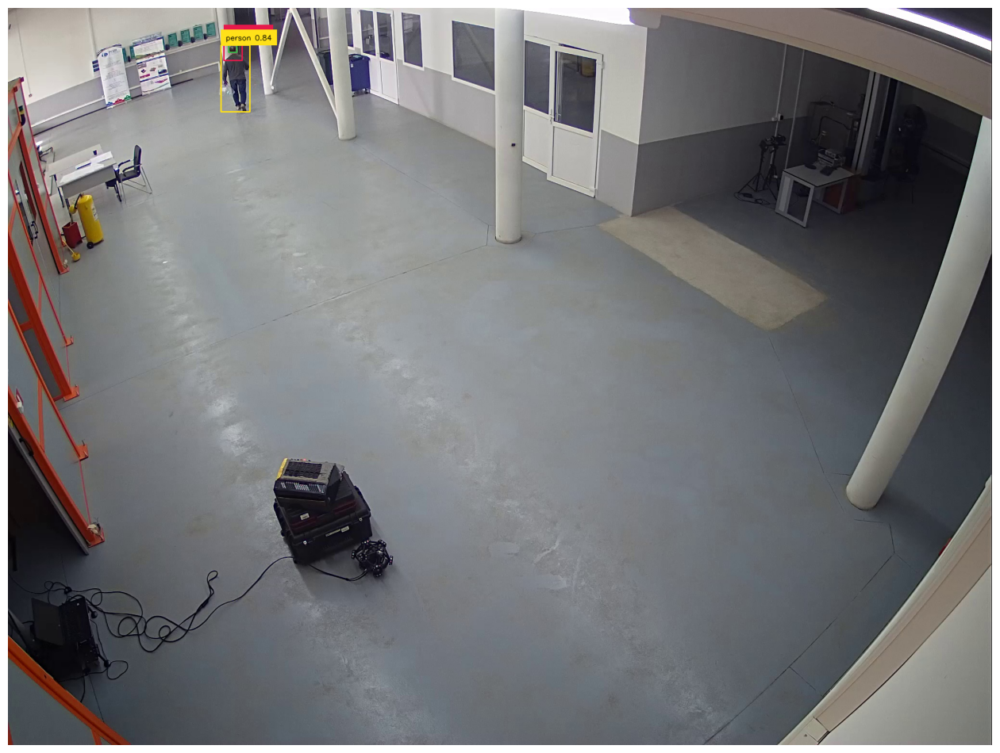

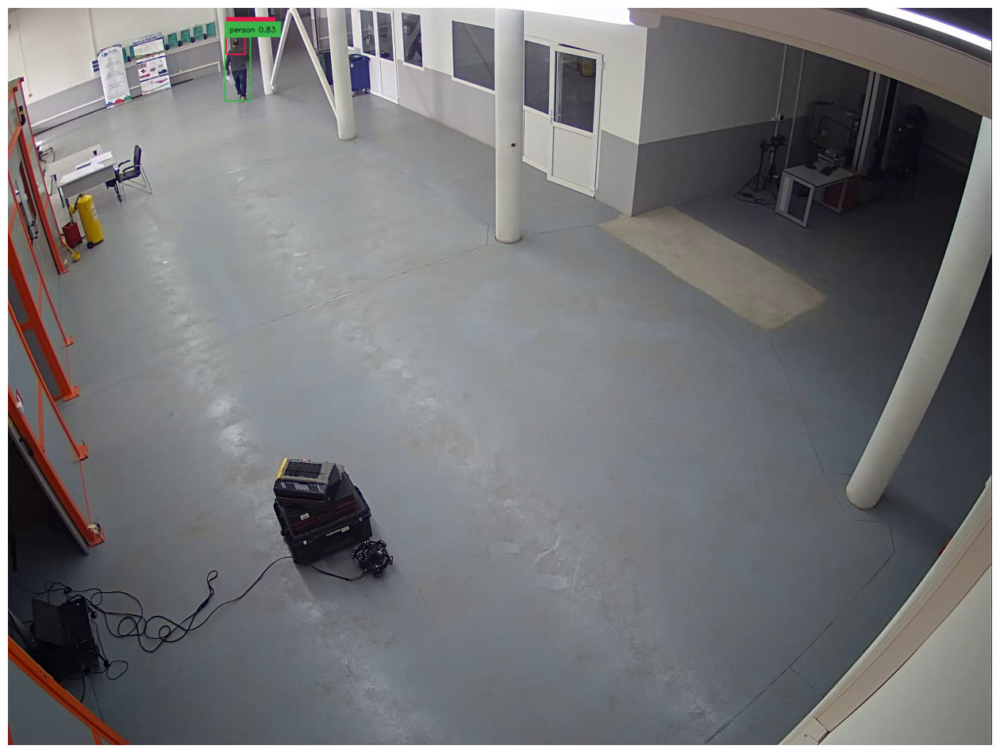

RuntimeError: ignored

In [ ]:
BOX_TRESHOLD = 0.3
TEXT_TRESHOLD = 0.25

for image_path in img_path_list:
    image_source, image = load_image(image_path)

    boxes, logits, phrases = [], [], []

    for text_prompt in classes:

        boxes_, logits_, phrases_ = predict(
            model=model,
            image=image,
            caption=text_prompt,
            box_threshold=BOX_TRESHOLD,
            text_threshold=TEXT_TRESHOLD
        )
        boxes.extend(boxes_.tolist())
        logits.extend(logits_.tolist())
        phrases.extend(phrases_)


    boxes = torch.tensor(boxes)
    label_path = '.'.join(image_path.split('.')[:-1] + ['txt']).replace('images', 'labels')
    content = '\n'.join([' '.join([str(classes_dict[phrase]), *map(lambda x: str(round(x, 6)), box.tolist())]) for box, logit, phrase in zip(boxes, logits, phrases)])
    with open(label_path, 'wt') as fp:
        fp.write(content)

    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

    sv.plot_image(annotated_frame, (16, 16))

In [ ]:
import shutil

# Путь к вашей папке в Colab
source_dir = '/content/work_dir'

# Путь к папке в Google Drive
destination_dir = '/content/drive/MyDrive/preanotate'

import shutil

# Копирование папки из Colab в Google Drive
shutil.copytree(source_dir, destination_dir)

In [ ]:
!export LC_ALL=C.UTF-8
!export LANG=C.UTF-8

!cp -r /content/work_dir /content/drive/MyDrive/preanotate


In [ ]:
import shutil
# Путь к папке в Colab
source_folder = '/content/work_dir'  # Укажите путь к вашей папке в Colab

# Путь к папке в Google Drive
destination_folder = '/content/drive/MyDrive/preanotate/'  # Укажите путь к вашей папке в Google Drive

# # Копирование папки из Colab в Google Drive
shutil.copytree(source_folder, destination_folder)
